## Recommendation System

___

Importing the necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
pd.set_option('display.max_rows',None,'display.max_columns',None,'display.max_colwidth',None)
import warnings
warnings.filterwarnings('ignore','FutureWarning')


Reading the dataset


In [2]:
df=pd.read_csv('recommendation-task.csv')

In [3]:
df.head()

,user_id,link
0,152,https://froala.com/wysiwyg-editor/
1,1247,https://www.geeksforgeeks.org/find-median-of-list-in-python/
2,1247,https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python
3,1247,https://builtin.com/data-science/pytorch-vs-tensorflow
4,1247,https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images


In [4]:
df.shape

(2599, 2)

Checking on the null values

In [5]:
df.isnull().sum()

user_id    0
link       1
dtype: int64

Since There is only one null value, we could drop the row.

In [6]:
df.dropna(axis=0,inplace=True)

In [7]:
df['user_id'].describe()

count     2598.000000
mean      3844.597383
std       3346.833438
min        152.000000
25%       1393.000000
50%       1539.000000
75%       5408.000000
max      13292.000000
Name: user_id, dtype: float64

In [8]:
df['link'].describe()

count                                                                               2598
unique                                                                              2478
top       https://sparkbyexamples.com/pyspark/pandas-vs-pyspark-dataframe-with-examples/
freq                                                                                   4
Name: link, dtype: object

The total number of Unique Users

In [9]:
print(df['user_id'].nunique())
df['user_id'].unique()

50


array([  152,  1247,  1320,  1393,  1539,  1685,  2123,  2269,  2415,
        2488,  2634,  2999,  3072,  3145,  3437,  3510,  3656,  3875,
        4021,  4094,  4167,  4313,  4386,  4459,  4751,  4824,  5043,
        5408,  6941,  7087,  8620,  8766,  8985,  9131,  9277,  9496,
       11467, 11686, 11905, 12270, 12343, 12416, 12635, 12708, 12781,
       12854, 12927, 13000, 13146, 13292], dtype=int64)

The 2600 links have been viewed by only 50 unique users.

Lets Find how many links each unique users have viewed

In [10]:
df.groupby('user_id').count().head()

,link
user_id,
152,1
1247,388
1320,40
1393,557
1539,340


In [11]:
df['link'].head()

0                                                https://froala.com/wysiwyg-editor/
1                      https://www.geeksforgeeks.org/find-median-of-list-in-python/
2    https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python
3                            https://builtin.com/data-science/pytorch-vs-tensorflow
4        https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images
Name: link, dtype: object

Let us find if any links have been viewed by multiple users.

In [12]:
df.groupby('link').count().sort_values(by='user_id',ascending=False).head(10)

,user_id
link,
https://sparkbyexamples.com/pyspark/pandas-vs-pyspark-dataframe-with-examples/,4
https://www.loom.com/share/a4c4e244305c4a45803f46f51991d57f,3
https://www.js-tutorials.com/javascript-tutorial/reading-csv-file-using-javascript-html5/,3
https://en.wikipedia.org/wiki/Frequency-resolved_optical_gating,3
https://www.youtube.com/watch?v=ng2o98k983k,3
https://medium.com/open-machine-learning-course/open-machine-learning-course-topic-9-time-series-analysis-in-python-a270cb05e0b3,3
https://statinfer.com/204-4-2-calculating-sensitivity-and-specificity-in-python/,3
https://opensource.com/article/18/4/flask,3
https://www.youtube.com/watch?v=rE_bJl2GAY8,3


There is no much repetition in links viewed by the users. 

____

### Extracting the Domain name alone from the given link

- Using Regular Expression splitting down the domain url seperately.
- Then Extracting name of the domain seperately slicing operations.

In [13]:
import re
with_1_dot='https://statinfer.com/204-4-2-calculating-sensitivity-and-specificity-in-python/'
with_2_dots='https://www.youtube.com/watch?v=rE_bJl2GAY8'
m = re.search('https?://([A-Za-z_0-9.-]+).*', with_1_dot)
i=m.group(1)
i

'statinfer.com'

In [14]:
i=m.group(1)
if i.count('.')==2:
    i=i[i.index('.')+1:]
    i=i[:i.index('.')]
elif i.count('.')==1:
    i=i[:i.index('.')]
else:
    pass
i

'statinfer'

Converting the above blocks of code to functions

In [15]:
import re

def domain_find(l):

    m = re.search('https?://([A-Za-z_0-9.-]+).*', l)
    if m:
        return m.group(1)
    else:
        return "file" # These include files(like pdf) which are located in the local computer.

def shrink(i):
    if i.count('.')==2:
        i=i[i.index('.')+1:]
        i=i[:i.index('.')]
    elif i.count('.')==1:
        i=i[:i.index('.')]
    else:
        pass
    return i


Applying the functions to every link in dataframe

In [16]:
dot=df['link'].apply(domain_find)

In [17]:
dot.head()

0               froala.com
1    www.geeksforgeeks.org
2        stackoverflow.com
3              builtin.com
4        stackoverflow.com
Name: link, dtype: object

In [18]:
dot=dot.apply(shrink)
    

In [19]:
dot.head()

0           froala
1    geeksforgeeks
2    stackoverflow
3          builtin
4    stackoverflow
Name: link, dtype: object

Now dot is a series of Parsed domain names of websites

### Finding the unparsed domain names

In [20]:
for i in dot:
    if i.count('.')>1:
        print(i)

web.itu.edu.tr
docs.atlas.mongodb.com
bugs.openjdk.java.net
www.javaforstudents.co.uk
www.science.smith.edu
docs.aws.amazon.com
docs.aws.amazon.com
minikube.sigs.k8s.io
www.math.ubc.ca
papers.www2017.com.au.s3-website-ap-southeast-2.amazonaws.com
guides.lib.umich.edu
docs.aws.amazon.com
www.toyota-ti.ac.jp
www.mia.uni-saarland.de
www.cs.utah.edu
www.acme.byu.edu
www.cs.utah.edu
www.math.toronto.edu
v1-18.docs.kubernetes.io
docs.aws.amazon.com
docs.aws.amazon.com
0.0.0.0
www3.ntu.edu.sg
docs.aws.amazon.com
docs.aws.amazon.com
docs.aws.amazon.com
colab.research.google.com
www.cs.toronto.edu
colab.research.google.com
colab.research.google.com
colab.research.google.com
colab.research.google.com
colab.research.google.com
colab.research.google.com
colab.research.google.com
colab.research.google.com
libguides.lib.msu.edu
minikube.sigs.k8s.io


These domains can be left as such since they are small in number


Applying the functions to the main DataFrame

In [21]:
df['domain']=df['link'].apply(domain_find)
df['domain']=df['domain'].apply(shrink)

In [22]:
df.head(10)

,user_id,link,domain
0,152,https://froala.com/wysiwyg-editor/,froala
1,1247,https://www.geeksforgeeks.org/find-median-of-list-in-python/,geeksforgeeks
2,1247,https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python,stackoverflow
3,1247,https://builtin.com/data-science/pytorch-vs-tensorflow,builtin
4,1247,https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images,stackoverflow
5,1247,https://medium.com/@weblab_tech/graphql-everything-you-need-to-know-58756ff253d8,medium
6,1247,"https://towardsdatascience.com/what-and-why-behind-fit-transform-vs-transform-in-scikit-learn-78f915cf96fe#:~:text=fit_transform()%20is%20used%20on,to%20scale%20our%20test%20data.",towardsdatascience
7,1247,https://hbr.org/2021/01/when-machine-learning-goes-off-the-rails,hbr
8,1247,https://medium.com/@lucyji/numpy-tutorial-the-basics-3ecd2717b855,medium
9,1247,https://medium.com/bhavaniravi/python-pandas-tutorial-92018da85a33,medium


____

###  Visualization of  Domains

Text(0.5, 1.0, 'Domain count')

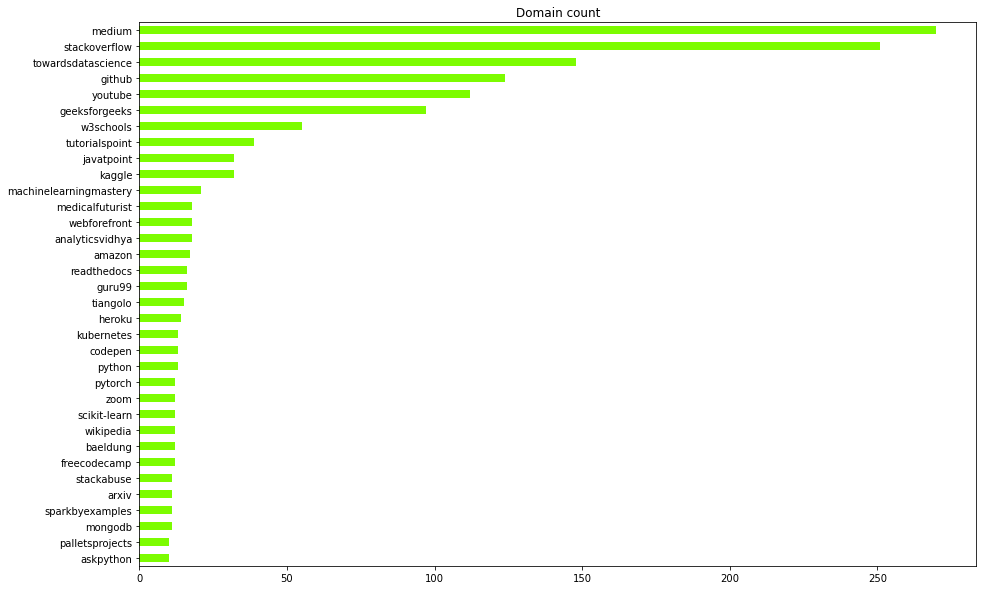

In [23]:
domain_viz= df['domain'].value_counts()[df['domain'].value_counts()>=10]
plt.figure(figsize=(15,10))
domain_viz.sort_values(ascending=True).plot(kind='barh',color='lawngreen')
plt.title('Domain count')

### Listing out the Keywords of the url

- Using Regular Expression to retrive Every words from the url.
- Removing the Stopwords from the list of words obtained using Spacy.
- Removing the commonly occuring words like 'www','com','org' from the list.

This process will retain the meaningful words from the url.

In [24]:
li=re.findall(r"[a-zA-Z]*",'https://medium.com/bhavaniravi/python-pandas-tutorial-92018da85a33')
li=list(filter(lambda x: len(x)>2,li))
li

['https', 'medium', 'com', 'bhavaniravi', 'python', 'pandas', 'tutorial']

Converting the above code to a function

In [25]:
def list_key(i):
    i=re.findall(r"[a-zA-Z]*",i)
    i=list(filter(lambda x: len(x)>2,i))
    return i

Applying the function to the main DataFrame

Removing Stopwords using Spacy

In [26]:
from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS

nlp1 = English()
text=list_key(df.loc[7,'link'])

filtered_sentence=[]
for word in text:
    lexeme = nlp1.vocab[word]
    if lexeme.is_stop == False:
        filtered_sentence.append(word) 
print(text)
print(filtered_sentence) 

['https', 'hbr', 'org', 'when', 'machine', 'learning', 'goes', 'off', 'the', 'rails']
['https', 'hbr', 'org', 'machine', 'learning', 'goes', 'rails']


- Converting these to a function and removing unwanted reptitive url words such as ['www','https','http','org','com','net','edu','htm','html','sites'] <br> 
- Combining 'machine' and 'learning' to 'machinelearning'<br>
- Combining 'data' and 'science' to 'datascience'


In [27]:
from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS

nlp1 = English()
def remove_stopwords(l):
    text=l

    filtered_sentence=[]
    for word in text:
        lexeme = nlp1.vocab[word]
        if lexeme.is_stop == False:
            word=word.lower()
            filtered_sentence.append(word)
    if 'www' in filtered_sentence:
        filtered_sentence.remove('www')
    if 'https' in filtered_sentence:
        filtered_sentence.remove('https')
    if 'http' in filtered_sentence:
        filtered_sentence.remove('http')
    if 'org' in filtered_sentence:
        filtered_sentence.remove('org')
    
    if 'com' in filtered_sentence:
        filtered_sentence.remove('com')
    if 'net' in filtered_sentence:
        filtered_sentence.remove('net')
    if 'edu' in filtered_sentence:
        filtered_sentence.remove('edu')
    if 'htm' in filtered_sentence:
        filtered_sentence.remove('htm')
    if 'html' in filtered_sentence:
        if filtered_sentence.index('html')==len(filtered_sentence)-1:
            filtered_sentence.remove('html')
    if 'sites' in filtered_sentence:
        filtered_sentence.remove('sites')
    if 'data' in filtered_sentence and 'science' in filtered_sentence:
        filtered_sentence.remove('data')
        filtered_sentence.remove('science')
        filtered_sentence.append('datascience')
    
    if 'machine' in filtered_sentence and 'learning' in filtered_sentence:
        filtered_sentence.remove('machine')
        filtered_sentence.remove('learning')
        filtered_sentence.append('machinelearning')
    return filtered_sentence

In [28]:
remove_stopwords(filtered_sentence)

['hbr', 'goes', 'rails', 'machinelearning']

### Retriving title of youtube videos

In [29]:
df[df['domain']=='youtube'].head(10)

,user_id,link,domain
23,1247,https://www.youtube.com/watch?v=Q8ApZXWgJq4,youtube
449,1393,https://www.youtube.com/watch?v=pHiMN_gy9mk,youtube
459,1393,https://www.youtube.com/watch?v=mqdglv9GnM8,youtube
463,1393,https://www.youtube.com/watch?v=DXBPtpBhGqo,youtube
492,1393,https://www.youtube.com/watch?v=Ki-xOKydQrY,youtube
522,1393,https://www.youtube.com/watch?v=HdlDYng8g9s,youtube
542,1393,https://www.youtube.com/watch?v=0kYIZE8Gl90,youtube
558,1393,https://www.youtube.com/watch?v=EW08rD-GFh0,youtube
580,1393,https://www.youtube.com/watch?v=CzdWqFTmn0Y,youtube
628,1393,https://www.youtube.com/watch?v=_H3aw6wkCv0,youtube


In [30]:
import urllib.request
import json
import urllib


url="https://www.youtube.com/watch?v=pHiMN_gy9mk"
params = {"format": "json", "url": url}
url = "https://www.youtube.com/oembed"
query_string = urllib.parse.urlencode(params)
url = url + "?" + query_string

with urllib.request.urlopen(url) as response:
    response_text = response.read()
    data = json.loads(response_text.decode())

yt_data=data['title']+ " "+data['author_name']
yt_data

'2020 Machine Learning Roadmap (95% valid for 2022) Daniel Bourke'

In [31]:
def extract_yt(link):
    url=link
    domain=domain_find(link)
    domain=shrink(domain)
    if domain=='youtube':
        params = {"format": "json", "url": url}
        url = "https://www.youtube.com/oembed"
        query_string = urllib.parse.urlencode(params)
        url = url + "?" + query_string

        with urllib.request.urlopen(url) as response:
            response_text = response.read()
            data = json.loads(response_text.decode())

        yt_data=data['title']+ " "+data['author_name']
        return yt_data
    else:
        pass

### making the changes on df by creating a new column key_words

In [32]:
l=[]
for i in df.index:
    if df.loc[i]['domain']=='youtube':
        try:
            x=extract_yt(df.loc[i]['link'])
        except:
            x=''
    else:
        x=df.loc[i]['link']
    x=list_key(x)
    x=remove_stopwords(x)
    l.append(x)
arr=np.array(l,dtype='object')

In [33]:
arr[:5]

array([list(['froala', 'wysiwyg', 'editor']),
       list(['geeksforgeeks', 'find', 'median', 'list', 'python']),
       list(['stackoverflow', 'questions', 'creating', 'range', 'dates', 'python']),
       list(['builtin', 'pytorch', 'tensorflow', 'datascience']),
       list(['stackoverflow', 'questions', 'docker', 'remove', 'tag', 'images'])],
      dtype=object)

In [34]:
df['key_words']=arr

Converting the above code to a function

In [35]:
def processing(df):
    l=[]
    for i in df.index:
        if df.loc[i]['domain']=='youtube':
            try:
                x=extract_yt(df.loc[i]['link'])
            except:
                x=''
        else:
            x=df.loc[i]['link']
        x=list_key(x)
        x=remove_stopwords(x)
        x=list(set(x))
        l.append(x)
    arr=np.array(l,dtype='object')
    df['key_words']=arr
    return df

In [36]:
df.head(10)

,user_id,link,domain,key_words
0,152,https://froala.com/wysiwyg-editor/,froala,"[froala, wysiwyg, editor]"
1,1247,https://www.geeksforgeeks.org/find-median-of-list-in-python/,geeksforgeeks,"[geeksforgeeks, find, median, list, python]"
2,1247,https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python,stackoverflow,"[stackoverflow, questions, creating, range, dates, python]"
3,1247,https://builtin.com/data-science/pytorch-vs-tensorflow,builtin,"[builtin, pytorch, tensorflow, datascience]"
4,1247,https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images,stackoverflow,"[stackoverflow, questions, docker, remove, tag, images]"
5,1247,https://medium.com/@weblab_tech/graphql-everything-you-need-to-know-58756ff253d8,medium,"[medium, weblab, tech, graphql, need, know]"
6,1247,"https://towardsdatascience.com/what-and-why-behind-fit-transform-vs-transform-in-scikit-learn-78f915cf96fe#:~:text=fit_transform()%20is%20used%20on,to%20scale%20our%20test%20data.",towardsdatascience,"[towardsdatascience, fit, transform, transform, scikit, learn, text, fit, transform, scale, test, data]"
7,1247,https://hbr.org/2021/01/when-machine-learning-goes-off-the-rails,hbr,"[hbr, goes, rails, machinelearning]"
8,1247,https://medium.com/@lucyji/numpy-tutorial-the-basics-3ecd2717b855,medium,"[medium, lucyji, numpy, tutorial, basics, ecd]"
9,1247,https://medium.com/bhavaniravi/python-pandas-tutorial-92018da85a33,medium,"[medium, bhavaniravi, python, pandas, tutorial]"


In [37]:
df[df['domain']=='youtube'].head(10)

,user_id,link,domain,key_words
23,1247,https://www.youtube.com/watch?v=Q8ApZXWgJq4,youtube,"[james, clear, atomic, habits, tiny, changes, create, remarkable, results, london, real, london, real]"
449,1393,https://www.youtube.com/watch?v=pHiMN_gy9mk,youtube,"[roadmap, valid, daniel, bourke, machinelearning]"
459,1393,https://www.youtube.com/watch?v=mqdglv9GnM8,youtube,"[parallelizing, scientific, python, dask, scipy, tutorial, james, crist, martin, durant, enthought]"
463,1393,https://www.youtube.com/watch?v=DXBPtpBhGqo,youtube,"[brief, introduction, causal, inference, course, preview, brady, neal, causal, inference]"
492,1393,https://www.youtube.com/watch?v=Ki-xOKydQrY,youtube,[]
522,1393,https://www.youtube.com/watch?v=HdlDYng8g9s,youtube,"[tutorial, python, hyper, parameter, tuning, gridsearchcv, codebasics, machinelearning]"
542,1393,https://www.youtube.com/watch?v=0kYIZE8Gl90,youtube,"[foundations, classifying, real, world, images, google, developers, machinelearning]"
558,1393,https://www.youtube.com/watch?v=EW08rD-GFh0,youtube,"[laplacian, intuition, khan, academy]"
580,1393,https://www.youtube.com/watch?v=CzdWqFTmn0Y,youtube,"[intro, lesson, jeremy, howard, machinelearning]"
628,1393,https://www.youtube.com/watch?v=_H3aw6wkCv0,youtube,"[stefan, otte, deep, neural, networks, pytorch, pydata, berlin, pydata]"


Retriving all keywords of the whole dataset

In [38]:

all_key_words=[]
for j,i in enumerate(df['key_words']):
    if df['domain'].iloc[j] in i:
        i.remove(df['domain'].iloc[j])
    all_key_words=all_key_words+i

In [39]:
len(all_key_words)

14242

## visualizing the keywords of the dataset

In [40]:
key_word_string=""
for i in all_key_words:
    key_word_string=key_word_string + i+" " 

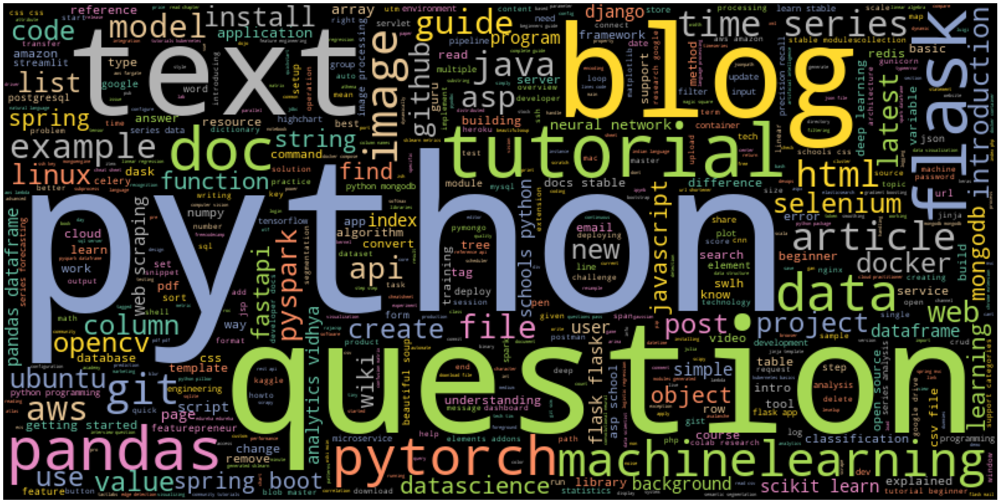

In [41]:
from wordcloud import WordCloud
plt.figure(figsize=(40, 20))
text=key_word_string

cloud=WordCloud(width=800,height=400,background_color='black',colormap='Set2',max_words=len(set(all_key_words))
               ,random_state=2)
cloud.generate(text)

plt.imshow(cloud)
plt.axis('off')
plt.show()

Creating a function for building wordcloud

In [42]:
def cloud(text):
    plt.figure(figsize=(10, 10))

    cloud=WordCloud(width=400,height=200,background_color='black',colormap='Set2',max_words=len(set(text))
               ,random_state=1)
    cloud.generate(text)

    plt.imshow(cloud)
    plt.axis('off')
    plt.show()

Getting the unique values of keywords, we find that most of the keywords are repeating.

In [43]:
unique_key_words=set(all_key_words)
len(unique_key_words)


3984

So most of the keywords are repeated

The keywords 'link' and 'domain' will create confusion while creating new columns for each keyword as we already have columns with names - link and domain.

we will delete the columns as they are not much technical words, also we will get no insight of it.

In [44]:
unique_key_words.remove('link')
unique_key_words.remove('domain')


In [45]:
#lets make a copy of df
df1=df.copy()


Creating new columns for each unique key word and filling it with 
  - 1 if the keyword is present in the respective link.
  - 0 if the keyword is not present in the respective link.

In [46]:
for i in unique_key_words:
    temp=[]
    for j in df['key_words']:
        if i in j:
            temp.append(1)
        else:
            temp.append(0)
    df[i]=np.array(temp)



In [47]:
df.head()

user_id  \
0      152   
1     1247   
2     1247   
3     1247   
4     1247   

                                                                             link  \
0                                              https://froala.com/wysiwyg-editor/   
1                    https://www.geeksforgeeks.org/find-median-of-list-in-python/   
2  https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python   
3                          https://builtin.com/data-science/pytorch-vs-tensorflow   
4      https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images   

          domain                                    key_words  type  \
0         froala                            [wysiwyg, editor]     0   
1  geeksforgeeks                 [find, median, list, python]     0   
2  stackoverflow  [questions, creating, range, dates, python]     0   
3        builtin           [pytorch, tensorflow, datascience]     0   
4  stackoverflow     [questions, docker, remove, tag, images]     0   

   supported  markwk  flaml  adbb  lhzetyim  kwargs  magic  transcription  \
0          0       0      0     0         0       0      0              0   
1          0       0      0     0         0       0      0              0   
2          0       0      0     0         0       0      0              0   
3          0       0      0     0         0       0      0              0   
4          0       0      0     0         0       0      0              0   

   helm  seg  mean  ver  transform  anisotropic  transformation  templates  \
0     0    0     0    0          0            0               0          0   
1     0    0     0    0          0            0               0          0   
2     0    0     0    0          0            0               0          0   
3     0    0     0    0          0            0               0          0   
4     0    0     0    0          0            0               0          0   

   shifting  hospitals  modelqueriesbysql  come  sql  dataprep  symmetric  \
0         0          0                  0     0    0         0          0   
1         0          0                  0     0    0         0          0   
2         0          0                  0     0    0         0          0   
3         0          0                  0     0    0         0          0   
4         0          0                  0     0    0         0          0   

   mlquestions  span  elb  strptime  riwhgmabclq  entropy  lstm  feedforward  \
0            0     0    0         0            0        0     0            0   
1            0     0    0         0            0        0     0            0   
2            0     0    0         0            0        0     0            0   
3            0     0    0         0            0        0     0            0   
4            0     0    0         0            0        0     0            0   

   blank  renewable  clearly  hyper  validation  summary  parse  bestselling  \
0      0          0        0      0           0        0      0            0   
1      0          0        0      0           0        0      0            0   
2      0          0        0      0           0        0      0            0   
3      0          0        0      0           0        0      0            0   
4      0          0        0      0           0        0      0            0   

   stuff  faers  hyperparameter  ceo  portuguese  attractor  tzhzumnzzvlrdx  \
0      0      0               0    0           0          0               0   
1      0      0               0    0           0          0               0   
2      0      0               0    0           0          0               0   
3      0      0               0    0           0          0               0   
4      0      0               0    0           0          0               0   

   acquire  vaibhavmishra  monitor  pydrive  activities  gojek  verified  \
0        0              0        0        0           0      0         0

### Giving equal weights of 1 to the domain and the matching keywords

Using get_dummies() to encode the domain column.

In [48]:
dummies=pd.get_dummies(df['domain'])
dummies.head()

,0.0.0.0,1upnote,2braces,365datascience,abhishek-tiwari,abodeqa,academia,activestate,adeveloperdiary,advancedscheduler,afourtech,aijobsboard,allthingstalent,allynh,alphr,amazon,amazonaws,amikelive,amiradata,analyticsindiamag,analyticsvidhya,andyfitzgeraldconsulting,anshulpatel,anyscale,apache,apiumhub,apkfab,appdividend,applause-button,aquafold,aroussi,arxiv,askpython,askubuntu,asme,aspose,atlassian,audacityteam,auth0,automaticaddison,awesomeopensource,aws,aws-dojo,babbel,back4app,baeldung,bashooka,bbbootstrap,bdtechtalks,beams,becominghuman,bestproxyreviews,betterdatascience,betterprogramming,bitbucket,bitsrc,blazingsql,blogspot,bogotobogo,bokeh,bootdey,boraji,botbark,brainly,brew,britannica,browsee,browserstack,bubble,bugs.openjdk.java.net,builtin,buymeacoffee,c-sharpcorner,calmcode,capradio,careercup,careerkarma,carrefax,celeryproject,changhsinlee,chrisalbon,chrisjean,chrome,circleci,cknotes,clay-atlas,cleartax,cloudacademy,cloudinary,cloudsavvyit,cncf,co,coast,codearmo,codeburst,codechef,codeforests,codegrepper,codehandbook,codejava,codemagic,codementor,codepasta,codepen,codeprimers,codeproject,coder-coder,codersbistro,coderzcolumn,codesdope,coiled,colab.research.google.com,colorhunt,colorlib,computingforgeeks,conda,continualai,conventionalcommits,coreyms,corporatefinanceinstitute,corrupt-a-file,cri-o,crowdanalytix,crummy,crunchify,crypto,css-tricks,css3transition,cssanimation,cssscript,cuelogic,cultbranding,cyberciti,dagshub,data-stats,dataarchitect,databricks,datacadamia,datacamp,datacarpentry,datadriveninvestor,datamuse,dataquest,datarobot,datasciencelearner,datasciencemadesimple,datascienceparichay,datasciencepr,datatechnotes,datatofish,dataversity,datavizpyr,debuggercafe,deeplearningweekly,delftstack,dennyzhang,designerslib,dev,dev2qa,devconnected,developer,devmountain,devopscon,devopscube,devopsmyway,devroom,digitalocean,distributedpython,divante,docker,docs.atlas.mongodb.com,docs.aws.amazon.com,dolthub,doordash,dotnettricks,drawdata,drawingfromdata,duckduckgo,dzone,earthdatascience,eclipse,ecommerce-platforms,educative,edureka,eff,elastic,elder,elitedatascience,embarcadero,endtoend,enlear,ericbrown,exploreflask,expo,fabianlee,faceprep,fast,fb,fda,file,fingent,finxter,firstpost,flaticon,fontawesome,frankensaurus,freecodecamp,freefrontend,freeprivacypolicy,fritz,froala,fullstackpython,futurelearn,futureoflife,garrymarsland,geekflare,geeksforgeeks,getargon,getbootstrap,getpocket,giladnaor,gilberttanner,git,git-scm,git-tower,gitbook,gitconnected,github,gitkraken,gitlab,gocertify,gojekengineering,golinuxcloud,goodreturns,google,googleblog,gouthamanbalaraman,greenteapress,guides.lib.umich.edu,gun,gunicorn,guru99,hackedtohired,hackernoon,hackerrank,hackingandslacking,hackr,hacksparrow,haikuforteams,hbr,helpguide,helpshift,heroku,herokuapp,hevodata,highcharts,highscalability,hindawi,home,hostinger,hotjar,how2shout,howchoo,howtocreateapps,howtodoinjava,howtogeek,html5doctor,hubofco,hubspot,ideone,idera,idkrtm,ig,imaging-resource,impactian,inblog,inceptivemind,includehelp,indiatimes,infoaryan,infoq,insidermonkey,instamobile,intellipaat,interviewbit,intmath,investopedia,ionos,ipaddressguide,iron,ironboundsoftware,isixsigma,itsfoss,itsourcecode,jamesclear,janakiev,javacodegeeks,javacodex,javadeveloperzone,javadevjournal,javaguides,javainterviewpoint,javainuse,javatpoint,jenkins,jeremyjordan,jhooq,johncanessa,joshlawman,journaldev,jovian,jquery-az,jqueryui,js,js-tutorials,jsbin,jsfiddle,juliabloggers,jupyter,kaggle,kanoki,kdnuggets,kernel,keywordtool,kickstarter,kinsta,kite,kivy,kleinproject,knime,knowledgehut,koalatea,koaning,kraftblick,krazytech,krunker,kubernetes,lambdatest,leanix,leanpub,learnaws,learnopencv,leawo,leima,lftechnology,libguides.lib.msu.edu,libhunt,likegeeks,linkedin,linode,linux,linuxconfig,linuxhandbook,linuxhint,linuxize,linuxteck,lipingyang,liquibase,listendata,liyanxu,localhost,logrocket,loom,machinecurve,machinelearning,machinelearningknowledge,machinelearningmastery,machinelearningplus,mailgun,maketechea

In [49]:
merge=pd.merge(df,dummies,on =df.index)
merge=merge.drop('key_0',axis=1)
merge.head()

user_id  \
0      152   
1     1247   
2     1247   
3     1247   
4     1247   

                                                                             link  \
0                                              https://froala.com/wysiwyg-editor/   
1                    https://www.geeksforgeeks.org/find-median-of-list-in-python/   
2  https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python   
3                          https://builtin.com/data-science/pytorch-vs-tensorflow   
4      https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images   

          domain                                    key_words  type  \
0         froala                            [wysiwyg, editor]     0   
1  geeksforgeeks                 [find, median, list, python]     0   
2  stackoverflow  [questions, creating, range, dates, python]     0   
3        builtin           [pytorch, tensorflow, datascience]     0   
4  stackoverflow     [questions, docker, remove, tag, images]     0   

   supported  markwk  flaml  adbb  lhzetyim  kwargs  magic  transcription  \
0          0       0      0     0         0       0      0              0   
1          0       0      0     0         0       0      0              0   
2          0       0      0     0         0       0      0              0   
3          0       0      0     0         0       0      0              0   
4          0       0      0     0         0       0      0              0   

   helm  seg  mean  ver  transform  anisotropic  transformation  templates  \
0     0    0     0    0          0            0               0          0   
1     0    0     0    0          0            0               0          0   
2     0    0     0    0          0            0               0          0   
3     0    0     0    0          0            0               0          0   
4     0    0     0    0          0            0               0          0   

   shifting  hospitals  modelqueriesbysql  come  sql  dataprep  symmetric  \
0         0          0                  0     0    0         0          0   
1         0          0                  0     0    0         0          0   
2         0          0                  0     0    0         0          0   
3         0          0                  0     0    0         0          0   
4         0          0                  0     0    0         0          0   

   mlquestions  span  elb  strptime  riwhgmabclq  entropy  lstm  feedforward  \
0            0     0    0         0            0        0     0            0   
1            0     0    0         0            0        0     0            0   
2            0     0    0         0            0        0     0            0   
3            0     0    0         0            0        0     0            0   
4            0     0    0         0            0        0     0            0   

   blank  renewable  clearly  hyper  validation  summary  parse  bestselling  \
0      0          0        0      0           0        0      0            0   
1      0          0        0      0           0        0      0            0   
2      0          0        0      0           0        0      0            0   
3      0          0        0      0           0        0      0            0   
4      0          0        0      0           0        0      0            0   

   stuff  faers  hyperparameter  ceo  portuguese  attractor  tzhzumnzzvlrdx  \
0      0      0               0    0           0          0               0   
1      0      0               0    0           0          0               0   
2      0      0               0    0           0          0               0   
3      0      0               0    0           0          0               0   
4      0      0               0    0           0          0               0   

   acquire  vaibhavmishra  monitor  pydrive  activities  gojek  verified  \
0        0              0        0        0           0      0         0

In [50]:
df=merge.copy()
df.shape

(2598, 4693)

Now the dataframe consists of both weights of keywords and domains.

In [51]:
df.head(10)

user_id  \
0      152   
1     1247   
2     1247   
3     1247   
4     1247   
5     1247   
6     1247   
7     1247   
8     1247   
9     1247   

                                                                                                                                                                                  link  \
0                                                                                                                                                   https://froala.com/wysiwyg-editor/   
1                                                                                                                         https://www.geeksforgeeks.org/find-median-of-list-in-python/   
2                                                                                                       https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python   
3                                                                                                                               https://builtin.com/data-science/pytorch-vs-tensorflow   
4                                                                                                           https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images   
5                                                                                                     https://medium.com/@weblab_tech/graphql-everything-you-need-to-know-58756ff253d8   
6  https://towardsdatascience.com/what-and-why-behind-fit-transform-vs-transform-in-scikit-learn-78f915cf96fe#:~:text=fit_transform()%20is%20used%20on,to%20scale%20our%20test%20data.   
7                                                                                                                     https://hbr.org/2021/01/when-machine-learning-goes-off-the-rails   
8                                                                                                                    https://medium.com/@lucyji/numpy-tutorial-the-basics-3ecd2717b855   
9                                                                                                                   https://medium.com/bhavaniravi/python-pandas-tutorial-92018da85a33   

               domain  \
0              froala   
1       geeksforgeeks   
2       stackoverflow   
3             builtin   
4       stackoverflow   
5              medium   
6  towardsdatascience   
7                 hbr   
8              medium   
9              medium   

                                                                             key_words  \
0                                                                    [wysiwyg, editor]   
1                                                         [find, median, list, python]   
2                                          [questions, creating, range, dates, python]   
3                                                   [pytorch, tensorflow, datascience]   
4                                             [questions, docker, remove, tag, images]   
5                                                  [weblab, tech, graphql, need, know]   
6  [fit, transform, transform, scikit, learn, text, fit, transform, scale, test, data]   
7                                                       [goes, rails, machinelearning]   
8                                               [lucyji, numpy, tutorial, basics, ecd]   
9                                              [bhavaniravi, python, pandas, tutorial]   

   type  supported  markwk  flaml  adbb  lhzetyim  kwargs  magic  \
0     0          0       0      0     0         0       0      0   
1     0          0       0      0     0         0       0      0   
2     0          0       0      0     0         0       0      0   
3     0          0       0      0     0         0       0      0   
4     0          0       0      0     0         0       0      0   
5     0          0       0      0     0         0       0      0   
6     0          0       0      0     0         0       0 

### Creating a Weight Matrix

Creating a Weight Matrix (weight vector for each user) by summation of weights of each keywords of the links that are seen by each user.

In [52]:
weight_matrix=df.groupby('user_id').sum()
weight_matrix.head(10)

type  supported  markwk  flaml  adbb  lhzetyim  kwargs  magic  \
user_id                                                                  
152         0          0       0      0     0         0       0      0   
1247        2          1       1      0     0         0       0      6   
1320        0          0       0      0     0         0       0      0   
1393        1          1       1      4     1         0       0      0   
1539        0          0       0      0     0         0       0      1   
1685        0          0       0      0     0         0       0      0   
2123        1          0       0      0     0         0       0      0   
2269        0          0       0      0     0         0       0      0   
2415        0          0       0      0     0         0       0      0   
2488        0          0       0      0     0         0       0      0   

         transcription  helm  seg  mean  ver  transform  anisotropic  \
user_id                                                                
152                  0     0    0     0    0          0            0   
1247                 0     0    0     1    0          2            0   
1320                 0     0    0     0    0          0            0   
1393                 0     1    0     3    1          0            0   
1539                 1     0    0     1    0          0            1   
1685                 0     0    0     0    0          0            0   
2123                 0     0    0     0    0          0            0   
2269                 0     0    0     0    0          0            0   
2415                 0     0    0     0    0          0            0   
2488                 0     0    0     0    0          0            0   

         transformation  templates  shifting  hospitals  modelqueriesbysql  \
user_id                                                                      
152                   0          0         0          0                  0   
1247                  0          0         0          0                  0   
1320                  0          0         0          0                  0   
1393                  4          2         0          0                  0   
1539                  0          0         0          0                  0   
1685                  0          1         0          0                  0   
2123                  0          0         0          0                  0   
2269                  0          0         0          0                  0   
2415                  0          0         0          0                  0   
2488                  0          0         0          0                  0   

         come  sql  dataprep  symmetric  mlquestions  span  elb  strptime  \
user_id                                                                     
152         0    0         0          0            0     0    0         0   
1247        1    3         0          0            0     0    1         1   
1320        0    0         0          0            0     0    0         0   
1393        0    3         1          1            0     0    0         0   
1539        0    3         0          0            0     0    0         0   
1685        0    0         0          0            0     0    0         0   
2123        0    0         0          0            0     0    0         0   
2269        0    0         0          0            0     0    0         0   
2415        0    0         0          0            0     0    0         0   
2488        0    0         0          0            0     0    0         0   

         riwhgmabclq  entropy  lstm  feedforward  blank  renewable  clearly  \
user_id                                                                       
152                0        0     0            0      0          0        0   
1247               0        0     0            0      0          1        0   
1320               0        0     0            0      0          0        0  

In [53]:
weight_matrix.shape



(50, 4689)

## Creating User-Product Matrix  

Creating User-Product Matrix by matrix multiplication of user-weight-matrix and link-weight-matrix

This matrix will store the strength of relation between each user and link.

In [54]:
df.head(10)

user_id  \
0      152   
1     1247   
2     1247   
3     1247   
4     1247   
5     1247   
6     1247   
7     1247   
8     1247   
9     1247   

                                                                                                                                                                                  link  \
0                                                                                                                                                   https://froala.com/wysiwyg-editor/   
1                                                                                                                         https://www.geeksforgeeks.org/find-median-of-list-in-python/   
2                                                                                                       https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python   
3                                                                                                                               https://builtin.com/data-science/pytorch-vs-tensorflow   
4                                                                                                           https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images   
5                                                                                                     https://medium.com/@weblab_tech/graphql-everything-you-need-to-know-58756ff253d8   
6  https://towardsdatascience.com/what-and-why-behind-fit-transform-vs-transform-in-scikit-learn-78f915cf96fe#:~:text=fit_transform()%20is%20used%20on,to%20scale%20our%20test%20data.   
7                                                                                                                     https://hbr.org/2021/01/when-machine-learning-goes-off-the-rails   
8                                                                                                                    https://medium.com/@lucyji/numpy-tutorial-the-basics-3ecd2717b855   
9                                                                                                                   https://medium.com/bhavaniravi/python-pandas-tutorial-92018da85a33   

               domain  \
0              froala   
1       geeksforgeeks   
2       stackoverflow   
3             builtin   
4       stackoverflow   
5              medium   
6  towardsdatascience   
7                 hbr   
8              medium   
9              medium   

                                                                             key_words  \
0                                                                    [wysiwyg, editor]   
1                                                         [find, median, list, python]   
2                                          [questions, creating, range, dates, python]   
3                                                   [pytorch, tensorflow, datascience]   
4                                             [questions, docker, remove, tag, images]   
5                                                  [weblab, tech, graphql, need, know]   
6  [fit, transform, transform, scikit, learn, text, fit, transform, scale, test, data]   
7                                                       [goes, rails, machinelearning]   
8                                               [lucyji, numpy, tutorial, basics, ecd]   
9                                              [bhavaniravi, python, pandas, tutorial]   

   type  supported  markwk  flaml  adbb  lhzetyim  kwargs  magic  \
0     0          0       0      0     0         0       0      0   
1     0          0       0      0     0         0       0      0   
2     0          0       0      0     0         0       0      0   
3     0          0       0      0     0         0       0      0   
4     0          0       0      0     0         0       0      0   
5     0          0       0      0     0         0       0      0   
6     0          0       0      0     0         0       0 

In [55]:
data=np.array(df.drop(['user_id','link','domain','key_words'],axis=1))
data.shape

(2598, 4689)

In [56]:
weight=np.array(weight_matrix)
weight.shape

(50, 4689)

In [57]:
data=data.T
user_product_matrix=weight.dot(data)
user_product_matrix.shape

(50, 2598)

In [58]:
user_product_df=pd.DataFrame(user_product_matrix.T,columns=weight_matrix.index)
user_product_df.head(10)

user_id,152,1247,1320,1393,1539,1685,2123,2269,2415,2488,2634,2999,3072,3145,3437,3510,3656,3875,4021,4094,4167,4313,4386,4459,4751,4824,5043,5408,6941,7087,8620,8766,8985,9131,9277,9496,11467,11686,11905,12270,12343,12416,12635,12708,12781,12854,12927,13000,13146,13292
0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,85,2,97,75,5,9,3,7,0,0,7,1,33,0,3,0,33,1,0,1,3,13,44,0,8,0,41,1,3,25,63,11,0,1,4,18,0,2,10,5,2,1,0,0,1,0,2,0,1
2,0,232,6,154,104,8,9,2,10,0,0,8,1,41,0,18,0,28,21,0,1,16,30,59,0,7,0,63,1,14,53,43,9,0,1,3,38,0,3,9,7,2,1,0,0,3,0,1,0,3
3,0,6,0,60,7,0,0,0,0,0,0,1,1,19,0,0,0,0,0,0,0,0,0,0,0,0,1,8,0,0,6,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,195,6,80,57,4,2,0,4,0,0,1,0,13,0,16,0,5,21,0,0,14,17,36,0,0,0,38,0,14,33,16,0,0,0,0,23,0,2,2,2,0,0,0,0,2,0,0,0,2
5,0,36,4,99,29,7,5,0,2,1,0,2,0,35,0,1,1,4,4,1,3,0,2,10,2,3,0,32,3,1,7,13,0,0,0,1,1,0,0,2,1,0,0,0,1,0,2,0,1,0
6,0,86,2,137,32,1,0,0,4,0,0,4,0,44,1,0,0,9,11,0,0,0,16,19,0,1,0,38,0,0,24,15,7,0,0,0,10,0,2,4,1,1,1,0,1,1,0,1,0,0
7,0,8,1,36,13,0,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,10,0,0,0,6,1,0,3,6,2,0,0,0,3,0,1,0,1,0,0,1,0,0,0,0,0,0
8,0,46,4,114,41,8,8,0,2,1,0,2,0,34,3,1,1,8,4,1,2,0,9,20,1,4,0,41,3,1,16,19,3,0,0,0,7,0,0,3,2,1,2,0,1,2,2,0,1,0
9,0,99,8,224,115,13,14,2,8,1,0,11,1,75,4,3,1,36,5,1,4,3,22,53,1,11,0,72,4,2,36,49,13,0,1,3,30,0,1,10,8,3,3,0,1,3,2,1,1,1


### adding the cloumns 'user_id','link' to user_product_df


In [59]:
user_product_df=pd.merge(df[['user_id','link']],user_product_df,on=df.index)
user_product_df=user_product_df.drop('key_0',axis=1)
user_product_df.head(10)

,user_id,link,152,1247,1320,1393,1539,1685,2123,2269,2415,2488,2634,2999,3072,3145,3437,3510,3656,3875,4021,4094,4167,4313,4386,4459,4751,4824,5043,5408,6941,7087,8620,8766,8985,9131,9277,9496,11467,11686,11905,12270,12343,12416,12635,12708,12781,12854,12927,13000,13146,13292
0,152,https://froala.com/wysiwyg-editor/,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1247,https://www.geeksforgeeks.org/find-median-of-list-in-python/,0,85,2,97,75,5,9,3,7,0,0,7,1,33,0,3,0,33,1,0,1,3,13,44,0,8,0,41,1,3,25,63,11,0,1,4,18,0,2,10,5,2,1,0,0,1,0,2,0,1
2,1247,https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python,0,232,6,154,104,8,9,2,10,0,0,8,1,41,0,18,0,28,21,0,1,16,30,59,0,7,0,63,1,14,53,43,9,0,1,3,38,0,3,9,7,2,1,0,0,3,0,1,0,3
3,1247,https://builtin.com/data-science/pytorch-vs-tensorflow,0,6,0,60,7,0,0,0,0,0,0,1,1,19,0,0,0,0,0,0,0,0,0,0,0,0,1,8,0,0,6,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
4,1247,https://stackoverflow.com/questions/33913020/docker-remove-none-tag-images,0,195,6,80,57,4,2,0,4,0,0,1,0,13,0,16,0,5,21,0,0,14,17,36,0,0,0,38,0,14,33,16,0,0,0,0,23,0,2,2,2,0,0,0,0,2,0,0,0,2
5,1247,https://medium.com/@weblab_tech/graphql-everything-you-need-to-know-58756ff253d8,0,36,4,99,29,7,5,0,2,1,0,2,0,35,0,1,1,4,4,1,3,0,2,10,2,3,0,32,3,1,7,13,0,0,0,1,1,0,0,2,1,0,0,0,1,0,2,0,1,0
6,1247,"https://towardsdatascience.com/what-and-why-behind-fit-transform-vs-transform-in-scikit-learn-78f915cf96fe#:~:text=fit_transform()%20is%20used%20on,to%20scale%20our%20test%20data.",0,86,2,137,32,1,0,0,4,0,0,4,0,44,1,0,0,9,11,0,0,0,16,19,0,1,0,38,0,0,24,15,7,0,0,0,10,0,2,4,1,1,1,0,1,1,0,1,0,0
7,1247,https://hbr.org/2021/01/when-machine-learning-goes-off-the-rails,0,8,1,36,13,0,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,10,0,0,0,6,1,0,3,6,2,0,0,0,3,0,1,0,1,0,0,1,0,0,0,0,0,0
8,1247,https://medium.com/@lucyji/numpy-tutorial-the-basics-3ecd2717b855,0,46,4,114,41,8,8,0,2,1,0,2,0,34,3,1,1,8,4,1,2,0,9,20,1,4,0,41,3,1,16,19,3,0,0,0,7,0,0,3,2,1,2,0,1,2,2,0,1,0
9,1247,https://medium.com/bhavaniravi/python-pandas-tutorial-92018da85a33,0,99,8,224,115,13,14,2,8,1,0,11,1,75,4,3,1,36,5,1,4,3,22,53,1,11,0,72,4,2,36,49,13,0,1,3,30,0,1,10,8,3,3,0,1,3,2,1,1,1


### Recommendation for Users

Getting the Text for each user to build a wordcloud

In [60]:
def get_text(test_id):
    l=""
    for i in df1[df1['user_id']==test_id].index:
        l=l+ str(df1.loc[i,'domain'])+" "
        for j in df1.loc[i,'key_words']:
            l=l+str(j)+" "
    return l

Links User has viewed -

2576                                                                                  http://wiki.tactii.com/miniconda.html
2577                                                               https://flask.palletsprojects.com/en/2.0.x/installation/
2578                                                      https://pythonise.com/series/learning-flask/flask-uploading-files
2579                                                                                https://pythonhosted.org/Flask-Uploads/
2580    https://github.com/PrettyPrinted/youtube_video_code/tree/master/2020/01/06/Using%20Flask-WTF%20With%20Flask-Uploads
2581                                                                   https://werkzeug.palletsprojects.com/en/2.0.x/utils/
2582                                                                                     https://pypi.org/project/PyQRCode/
2583                                                                           https://testdriven.io/blog/w

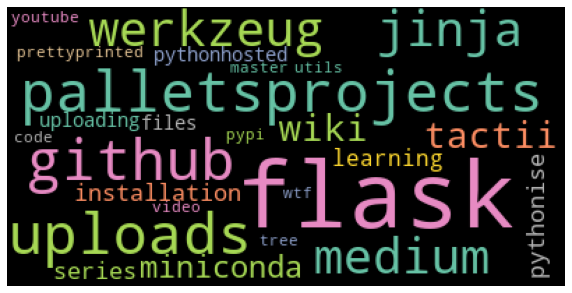

,Score,link
1746,10,"https://medium.com/@amelie_yeh/data-visualization-on-the-web-with-flask-11a3b1f7a476#:~:text=To%20show%20the%20results%20of,engine%20and%20Werkzeug%20WSGI%20toolkit."
165,9,"https://overiq.com/flask-101/basics-of-jinja-template-language/#:~:text=if%20statement,-The%20if%20statement&text=If%20the%20value%20of%20variable,defined%20it%20evaluates%20to%20false.&text=Here%20if%20the%20variable%20loggedin,logged%20in%22%20will%20be%20printed."
1572,8,https://blog.miguelgrinberg.com/post/how-to-add-flask-migrate-to-an-existing-project
1331,8,https://medium.com/technest/build-a-crud-app-with-flask-bootstrap-heroku-60dfa3a788e8
1740,8,https://flask.palletsprojects.com/en/1.1.x/quickstart/#debug-mode
1909,8,https://medium.com/@gokulprakash22/getting-started-with-flask-pymongo-d6326db2a9a7
2069,8,https://medium.com/@balramchavan/angular-python-flask-full-stack-demo-27192b8de1a3
1291,8,https://medium.com/hootsuite-engineering/hot-reloading-on-a-dockerized-flask-app-4e87b88ea303
1633,8,https://flask.palletsprojects.com/en/1.1.x/quickstart/#sessions
2572,8,https://flask.palletsprojects.com/en/2.0.x/tutorial/static/


In [61]:
test_id=12927
print("Links User has viewed -\n")
print(user_product_df[user_product_df['user_id']==test_id]['link'])

print("\n")
print("Recommended Links for the user- \n")

test_df=user_product_df[user_product_df['user_id']!=test_id][[test_id,'link']].sort_values(by=test_id,ascending=False)
test_df=test_df.drop_duplicates('link')

test_user_seen=user_product_df[user_product_df['user_id']==test_id]['link']
for i,j in zip(test_df.index,test_df['link']):
    if j in test_user_seen.tolist():
        test_df.drop(i,inplace=True)

test_df.rename(columns={test_id:'Score'},inplace=True)
test_df=test_df[test_df['Score']>0]
text=get_text(test_id)
cloud(text)
test_df

____

In [62]:
#functions
import re

from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS

from wordcloud import WordCloud

nlp1 = English()

def domain_find(l):

    m = re.search('https?://([A-Za-z_0-9.-]+).*', l)
    if m:
        return m.group(1)
    else:
        return "file" # These include files(like pdf) which are located in the local computer.

def shrink(i):
    if i.count('.')==2:
        i=i[i.index('.')+1:]
        i=i[:i.index('.')]
    elif i.count('.')==1:
        i=i[:i.index('.')]
    else:
        pass
    return i

def list_key(i):
    i=re.findall(r"[a-zA-Z]*",i)
    i=list(filter(lambda x: len(x)>2,i))
    return i


def remove_stopwords(l):
    text=l

    filtered_sentence=[]
    for word in text:
        lexeme = nlp1.vocab[word]
        if lexeme.is_stop == False:
            word=word.lower()
            filtered_sentence.append(word)
    if 'www' in filtered_sentence:
        filtered_sentence.remove('www')
    if 'https' in filtered_sentence:
        filtered_sentence.remove('https')
    if 'http' in filtered_sentence:
        filtered_sentence.remove('http')
    if 'org' in filtered_sentence:
        filtered_sentence.remove('org')
    
    if 'com' in filtered_sentence:
        filtered_sentence.remove('com')
    if 'net' in filtered_sentence:
        filtered_sentence.remove('net')
    if 'edu' in filtered_sentence:
        filtered_sentence.remove('edu')
    if 'htm' in filtered_sentence:
        filtered_sentence.remove('htm')
    if 'html' in filtered_sentence:
        if filtered_sentence.index('html')==len(filtered_sentence)-1:
            filtered_sentence.remove('html')
    if 'sites' in filtered_sentence:
        filtered_sentence.remove('sites')
    if 'data' in filtered_sentence and 'science' in filtered_sentence:
        filtered_sentence.remove('data')
        filtered_sentence.remove('science')
        filtered_sentence.append('datascience')
    
    if 'machine' in filtered_sentence and 'learning' in filtered_sentence:
        filtered_sentence.remove('machine')
        filtered_sentence.remove('learning')
        filtered_sentence.append('machinelearning')
    return filtered_sentence

def get_text(test_id,df1):
    l=""
    for i in df1[df1['user_id']==test_id].index:
        l=l+ str(df1.loc[i,'domain'])+" "
        for j in df1.loc[i,'key_words']:
            l=l+str(j)+" "
    return l

def cloud(text):
    plt.figure(figsize=(10, 10))

    cloud=WordCloud(width=400,height=200,background_color='black',colormap='Set2',max_words=len(set(text))
               ,random_state=1)
    cloud.generate(text)

    plt.imshow(cloud)
    plt.axis('off')
    plt.show()

In [63]:
class recommender_system():
    def __init__(self,df):
        self.df=df
        self.user_product_df=None
        self.df_processed=None
    
    def process_data(self,df):
        
        df.dropna(axis=0,inplace=True)
        
        df['domain']=df['link'].apply(domain_find)
        
        df['domain']=df['domain'].apply(shrink)
        
        df=processing(df)
        
        self.df_processed=df
        
        return df
    
    def find_all_keywords(self,df):
        all_key_words=[]
        for j,i in enumerate(df['key_words']):
            if df['domain'].iloc[j] in i:
                i.remove(df['domain'].iloc[j])
            all_key_words=all_key_words+i
        
        all_key_words=set(all_key_words)
        
        all_key_words.remove('link')
        
        all_key_words.remove('domain')
        
        return all_key_words
    
    def create_weights(self,all_key_words,df):
        
        for i in all_key_words:
            temp=[]
            for j in df['key_words']:
                if i in j:
                    temp.append(1)
                else:
                    temp.append(0)
            df[i]=np.array(temp)
        
        dummies=pd.get_dummies(df['domain'])
        
        merge=pd.merge(df,dummies,on =df.index)
        
        merge=merge.drop('key_0',axis=1)
        
        df=merge.copy()
        
        weight_matrix=df.groupby('user_id').sum()
        
        
        
        return weight_matrix,df

    def create_user_product_matrix(self,df,weight_matrix,):
        data=np.array(df.drop(['user_id','link','domain','key_words'],axis=1))
        
        weight=np.array(weight_matrix)
        
        data=data.T
        user_product_matrix=weight.dot(data)
        
        user_product_df=pd.DataFrame(user_product_matrix.T,columns=weight_matrix.index)
        
        user_product_df=pd.merge(df[['user_id','link']],user_product_df,on=df.index)
        user_product_df=user_product_df.drop('key_0',axis=1)
        
        return user_product_df
    
    def build_recommendation(self):
        processed_df=self.process_data(self.df)
        keywords=self.find_all_keywords(processed_df)
        
        weight_matrix,processed_df=self.create_weights(keywords,processed_df)
        
        self.user_product_df=self.create_user_product_matrix(processed_df,weight_matrix)
        
    def recommend(self,test_id,n_recommendations=10):
        user_product_df=self.user_product_df
        
        print("Recommended Links for the user- \n")

        test_df=user_product_df[user_product_df['user_id']!=test_id][[test_id,'link']].sort_values(by=test_id,ascending=False)
        test_df=test_df.drop_duplicates('link')

        test_user_seen=user_product_df[user_product_df['user_id']==test_id]['link']
        for i,j in zip(test_df.index,test_df['link']):
            if j in test_user_seen.tolist():
                test_df.drop(i,inplace=True)

        test_df.rename(columns={test_id:'Score'},inplace=True)
        test_df=test_df[test_df['Score']>0]
        return test_df.head(n_recommendations)
    
    def user_links(self,test_id):
        df=self.df
        return df[df['user_id']==test_id]['link']
    
    def cloud(self,test_id):
        text = get_text(test_id,self.df_processed)
        cloud(text)


In [64]:
df=pd.read_csv('recommendation-task.csv')

In [65]:
r=recommender_system(df)


In [66]:
r.build_recommendation()

In [67]:
r.recommend(12270,100)

Recommended Links for the user- 



,Score,link
1402,21,"https://www.analyticsvidhya.com/blog/2020/01/3-important-nlp-libraries-indian-languages-python/#:~:text=%E2%80%9CThe%20Indic%20NLP%20Library%20is%20built%20to%20support,commonly%20required%20toolsets%20for%20Indian%20language%20text%20.%E2%80%9D"
1853,18,https://www.analyticsvidhya.com/blog/2020/08/web-scraping-selenium-with-python/
2467,16,https://stackoverflow.com/questions/31060396/writing-and-saving-csv-file-from-scraping-data-using-python-and-beautifulsoup4
1801,15,https://medium.com/swlh/introduction-to-selenium-create-a-web-bot-with-python-cd59a741fdae
1408,14,https://stackoverflow.com/questions/52690994/web-scraping-python-writing-to-a-csv
60,14,https://www.dataquest.io/blog/web-scraping-python-using-beautiful-soup/
1823,14,https://stackoverflow.com/questions/33155454/how-to-find-an-element-by-href-value-using-selenium-python/33155512
1793,14,https://medium.com/technofunnel/web-scraping-with-python-using-beautifulsoup-76b710e3e92f
1642,13,https://www.geeksforgeeks.org/implementing-web-scraping-python-beautiful-soup/
1841,13,https://medium.com/analytics-vidhya/build-simple-data-pipelines-from-scratch-using-postgresql-luigi-and-python-script-d3423f0a02d8


In [68]:
r.user_links(12270)

2505                      https://medium.com/avalanche-hub/why-avalanche-avax-has-the-potential-to-be-an-incredible-store-of-value-8ef6e68cbb60
2506                                                                                           https://kinsta.com/knowledgebase/what-is-github/
2507                                                                                        https://www.atlassian.com/git/tutorials/what-is-git
2508                                                                https://docs.microsoft.com/en-us/devops/develop/git/what-is-version-control
2509                                                                             https://www.stxnext.com/python-vs-other-programming-languages/
2510                                                             https://gilberttanner.com/blog/introduction-to-web-scraping-with-beautifulsoup
2511                                                                                                  https://docs.python.org/3/library/

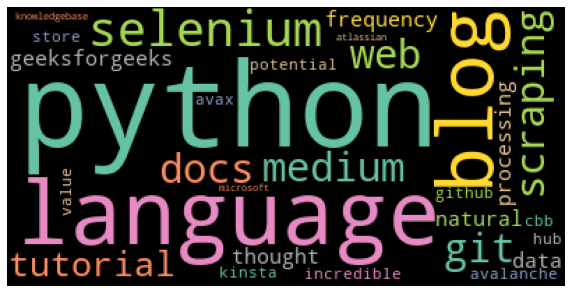

In [69]:
r.cloud(12270)

In [70]:
#df.iloc[1727]['key_words']

In [71]:
#df.groupby('user_id').count()['link']